In [2]:
import os
import numpy as np 
from pynwb import NWBHDF5IO
import matplotlib.pyplot as plt 

%matplotlib inline

In [3]:
# List out available data assets with NWB files 
np.sort([file for file in os.listdir('/data') if 'nwb' in file])

array(['721291_test_ophys_nwb', '721291_test_ophys_nwb_1',
       '721291_test_ophys_nwb_10', '721291_test_ophys_nwb_11',
       '721291_test_ophys_nwb_12', '721291_test_ophys_nwb_2',
       '721291_test_ophys_nwb_3', '721291_test_ophys_nwb_4',
       '721291_test_ophys_nwb_5', '721291_test_ophys_nwb_6',
       '721291_test_ophys_nwb_7', '721291_test_ophys_nwb_8',
       '721291_test_ophys_nwb_9', 'nwb'], dtype='<U24')

In [4]:
def load_nwb(nwb_index): 
    ''' 
    Load an NWB file from attached data asset
    Finds relevant NWB path by indexing into sorted list of asset names 
    '''
    # get attached assets that have NWB in the name
    folders = np.sort([file for file in os.listdir('/data') if 'nwb' in file])
    # Get the NWB file name from the specified folder
    nwb_filename = [file for file in os.listdir('/data/'+folders[nwb_index]) if 'multiplane' in file][0]
    # Get the full path
    nwb_path = os.path.join('/data/', folders[nwb_index], nwb_filename)
    print(nwb_path)
    # Load the file
    io = NWBHDF5IO(nwb_path, mode="r")
    nwb = io.read()
    return nwb

### Examine first NWB file

In [5]:
nwb = load_nwb(nwb_index=0)

/data/721291_test_ophys_nwb/multiplane-ophys_731327_2024-08-22_14-11-29.nwb


In [6]:
nwb

root pynwb.file.NWBFile at 0x139867461484352
Fields:
  devices: {
    MESO.2 <class 'pynwb.device.Device'>
  }
  file_create_date: [datetime.datetime(2024, 9, 25, 19, 20, 32, 840787, tzinfo=tzutc())]
  identifier: 8b1d4686-bc0a-4697-8c9d-55e87256f9e0
  imaging_planes: {
    VISp_0 <class 'pynwb.ophys.ImagingPlane'>,
    VISp_1 <class 'pynwb.ophys.ImagingPlane'>,
    VISp_2 <class 'pynwb.ophys.ImagingPlane'>,
    VISp_3 <class 'pynwb.ophys.ImagingPlane'>,
    VISp_4 <class 'pynwb.ophys.ImagingPlane'>,
    VISp_5 <class 'pynwb.ophys.ImagingPlane'>,
    VISp_6 <class 'pynwb.ophys.ImagingPlane'>,
    VISp_7 <class 'pynwb.ophys.ImagingPlane'>
  }
  institution: Allen Institute for Neural Dynamics
  lab_meta_data: {
    VISp_0 <class 'abc.OphysMetadataSchema'>,
    VISp_1 <class 'abc.OphysMetadataSchema'>,
    VISp_2 <class 'abc.OphysMetadataSchema'>,
    VISp_3 <class 'abc.OphysMetadataSchema'>,
    VISp_4 <class 'abc.OphysMetadataSchema'>,
    VISp_5 <class 'abc.OphysMetadataSchema'>,
    VISp_6 <class 'abc.OphysMetadataSchema'>,
    VISp_7 <class 'abc.OphysMetadataSchema'>
  }
  processing: {
    ophys_plane_VISp_0 <class 'pynwb.base.ProcessingModule'>,
    ophys_plane_VISp_1 <class 'pynwb.base.ProcessingModule'>,
    ophys_plane_VISp_2 <class 'pynwb.base.ProcessingModule'>,
    ophys_plane_VISp_3 <class 'pynwb.base.ProcessingModule'>,
    ophys_plane_VISp_4 <class 'pynwb.base.ProcessingModule'>,
    ophys_plane_VISp_5 <class 'pynwb.base.ProcessingModule'>,
    ophys_plane_VISp_6 <class 'pynwb.base.ProcessingModule'>,
    ophys_plane_VISp_7 <class 'pynwb.base.ProcessingModule'>
  }
  session_description: NWB file generated by AIND pipeline
  session_id: multiplane-ophys_731327_2024-08-22_14-11-29
  session_start_time: 2024-08-22 14:11:29-07:00
  subject: subject pynwb.file.Subject at 0x139867460932272
Fields:
  age: P160D
  age__reference: birth
  date_of_birth: 2024-03-15 00:00:00-07:53
  genotype: Pvalb-IRES-Cre/wt;Ai162(TIT2L-GC6s-ICL-tTA2)/wt
  sex: M
  species: Mus musculus
  subject_id: 731327

  timestamps_reference_time: 2024-08-22 14:11:29-07:00

#### Look at processed data

In [7]:
# print contents of processing group
print(nwb.processing.keys())
# print contents of processing for a specific plane
print(nwb.processing['ophys_plane_VISp_0'].data_interfaces.keys() )
# print contents of 'data_interfaces'
print(nwb.processing['ophys_plane_VISp_0'].data_interfaces.keys())
# print contents of 'Fluorescence' field
print(nwb.processing['ophys_plane_VISp_0'].data_interfaces['Fluorescence'].roi_response_series)

dict_keys(['ophys_plane_VISp_0', 'ophys_plane_VISp_1', 'ophys_plane_VISp_2', 'ophys_plane_VISp_3', 'ophys_plane_VISp_4', 'ophys_plane_VISp_5', 'ophys_plane_VISp_6', 'ophys_plane_VISp_7'])
dict_keys(['Fluorescence', 'dff', 'event_timeseries', 'image_segmentation', 'images', 'neuropil_corrected_timeseries', 'neuropil_fluorescence_timeseries'])
dict_keys(['Fluorescence', 'dff', 'event_timeseries', 'image_segmentation', 'images', 'neuropil_corrected_timeseries', 'neuropil_fluorescence_timeseries'])
{'ROI_fluorescence_timeseries': ROI_fluorescence_timeseries pynwb.ophys.RoiResponseSeries at 0x139867461072784
Fields:
  comments: no comments
  conversion: 1.0
  data: <HDF5 dataset "data": shape (39128, 114), type "<f4">
  description: no description
  interval: 1
  offset: 0.0
  resolution: -1.0
  rois: rois <class 'hdmf.common.table.DynamicTableRegion'>
  timestamps: <HDF5 dataset "timestamps": shape (39128,), type "<f8">
  timestamps_unit: seconds
  unit: a.u.
}


#### Look at processed data traces

In [8]:
# Get other trace types
print(nwb.processing['ophys_plane_VISp_0'].data_interfaces.keys())

dict_keys(['Fluorescence', 'dff', 'event_timeseries', 'image_segmentation', 'images', 'neuropil_corrected_timeseries', 'neuropil_fluorescence_timeseries'])


In [9]:
nwb.processing['ophys_plane_VISp_0'].data_interfaces['Fluorescence'].roi_response_series['ROI_fluorescence_timeseries']

ROI_fluorescence_timeseries pynwb.ophys.RoiResponseSeries at 0x139867461072784
Fields:
  comments: no comments
  conversion: 1.0
  data: <HDF5 dataset "data": shape (39128, 114), type "<f4">
  description: no description
  interval: 1
  offset: 0.0
  resolution: -1.0
  rois: rois <class 'hdmf.common.table.DynamicTableRegion'>
  timestamps: <HDF5 dataset "timestamps": shape (39128,), type "<f8">
  timestamps_unit: seconds
  unit: a.u.

In [10]:
# Whats in the roi table?
nwb.processing['ophys_plane_VISp_0'].data_interfaces['Fluorescence'].roi_response_series['ROI_fluorescence_timeseries'].rois.table

cell_specimen_table pynwb.ophys.PlaneSegmentation at 0x139867461073936
Fields:
  colnames: ['image_mask']
  columns: (
    image_mask <class 'hdmf.common.table.VectorData'>
  )
  description: cellpose-meanCellpose with mean intensity projection
  id: id <class 'hdmf.common.table.ElementIdentifiers'>
  imaging_plane: VISp_0 pynwb.ophys.ImagingPlane at 0x139867461074560
Fields:
  conversion: 1.0
  description: Two-photon imaging plane a
  device: MESO.2 pynwb.device.Device at 0x139867461074896
Fields:
  description: 422-mesoscope-20220218
  manufacturer: Thorlabs

  excitation_lambda: 920.0
  grid_spacing: <HDF5 dataset "grid_spacing": shape (2,), type "<f8">
  grid_spacing_unit: micrometer
  imaging_rate: 10.63
  indicator: Slc32a1-IRES-Cre/wt;Oi1(TIT2L-jGCaMP8s-WPRE-ICL-IRES-tTA2)/wt
  location: Structure: VISp Depth: 164
  optical_channel: (
    TODO <class 'pynwb.ophys.OpticalChannel'>
  )
  origin_coords: <HDF5 dataset "origin_coords": shape (3,), type "<f8">
  origin_coords_unit: micrometer
  unit: meters

In [11]:
# Get timestamps
timestamps = nwb.processing['ophys_plane_VISp_0'].data_interfaces['Fluorescence'].roi_response_series['ROI_fluorescence_timeseries'].timestamps
print(timestamps)

<HDF5 dataset "timestamps": shape (39128,), type "<f8">


39128
39128


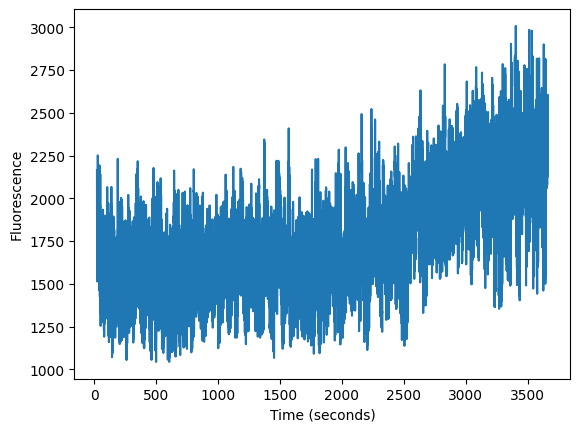

In [12]:
# Plot raw fluorescence traces with timeseries
traces = nwb.processing['ophys_plane_VISp_0'].data_interfaces['Fluorescence'].roi_response_series['ROI_fluorescence_timeseries'].data
print(len(traces[:, 0]))
print(len(timestamps))
plt.plot(timestamps[:], traces[:, 0])
plt.xlabel('Time (seconds)')
plt.ylabel('Fluorescence')
plt.show()

In [13]:
# Get other trace types
print(nwb.processing['ophys_plane_VISp_0'].data_interfaces.keys())

dict_keys(['Fluorescence', 'dff', 'event_timeseries', 'image_segmentation', 'images', 'neuropil_corrected_timeseries', 'neuropil_fluorescence_timeseries'])


39128
39128
39128


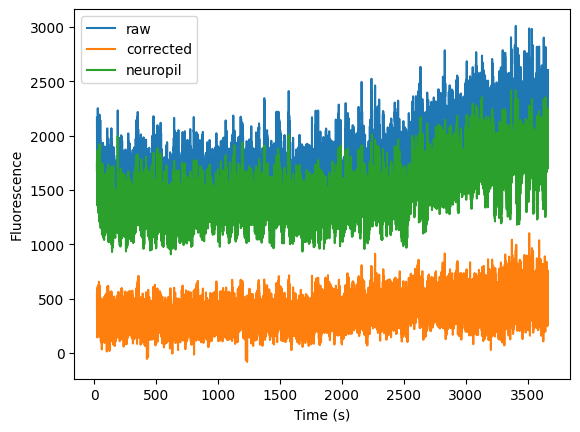

In [15]:
# Plot fluorescence and neuropil traces with events
raw_traces = nwb.processing['ophys_plane_VISp_0'].data_interfaces['Fluorescence'].roi_response_series['ROI_fluorescence_timeseries'].data
corrected_traces = nwb.processing['ophys_plane_VISp_0'].data_interfaces['neuropil_corrected_timeseries'].data
neuropil_traces = nwb.processing['ophys_plane_VISp_0'].data_interfaces['neuropil_fluorescence_timeseries'].data

cell_index = 0
print(len(raw_traces[:, cell_index]))
print(len(corrected_traces[:, cell_index]))
print(len(timestamps))
plt.plot(timestamps[:], raw_traces[:, cell_index], label='raw')
plt.plot(timestamps[:], corrected_traces[:, cell_index], label='corrected')
plt.plot(timestamps[:], neuropil_traces[:, cell_index], label='neuropil')
plt.xlabel('Time (s)')
plt.ylabel('Fluorescence')
# plt.xlim(500, 600)
plt.legend()
plt.show()

39128
39128
39128


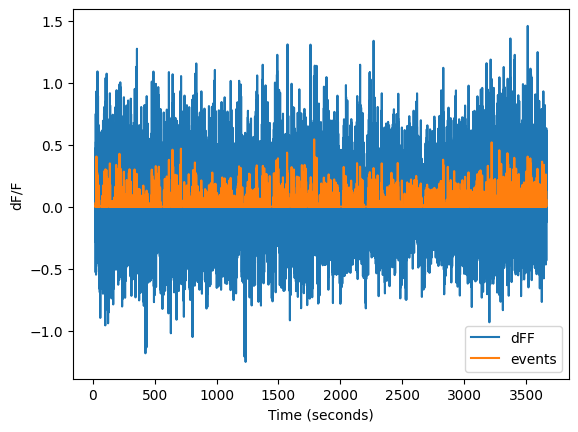

In [16]:
# Plot dFF traces with events
dff_traces = nwb.processing['ophys_plane_VISp_0'].data_interfaces['dff'].roi_response_series['dff_timeseries'].data
events = nwb.processing['ophys_plane_VISp_0'].data_interfaces['event_timeseries'].data

cell_index = 0
print(len(dff_traces[:, cell_index]))
print(len(events[:, cell_index]))
print(len(timestamps))
plt.plot(timestamps[:], dff_traces[:, cell_index], label='dFF')
plt.plot(timestamps[:], events[:, cell_index], label='events')
plt.xlabel('Time (seconds)')
plt.ylabel('dF/F')
# plt.xlim(500, 600)
plt.legend()
plt.show()

#### Plot projection images

In [25]:
nwb.processing['ophys_plane_VISp_0'].data_interfaces['images'].images

{'average_projection': <pynwb.image.GrayscaleImage at 0x7f356e58d100>,
 'max_projection': <pynwb.image.GrayscaleImage at 0x7f356e58d1c0>,
 'segmentation_mask_image': <pynwb.image.GrayscaleImage at 0x7f356e58d220>}

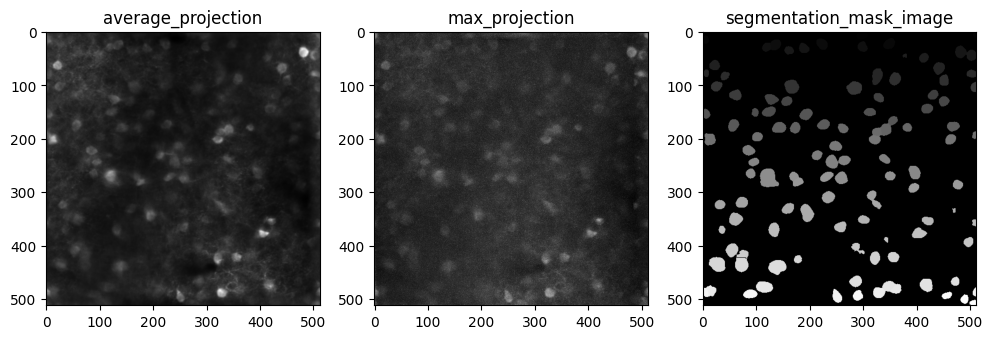

In [26]:
images = nwb.processing['ophys_plane_VISp_0'].data_interfaces['images'].images

fig, ax = plt.subplots(1, 3, figsize=(12, 4))
for i, image_type in enumerate(images.keys()): 
    ax[i].imshow(images[image_type], cmap='gray')
    ax[i].set_title(image_type)

#### Plot ROI masks

In [18]:
nwb.processing['ophys_plane_VISp_0'].data_interfaces['image_segmentation'].plane_segmentations.keys()


dict_keys(['cell_specimen_table'])

In [20]:
nwb.processing['ophys_plane_VISp_0'].data_interfaces['image_segmentation'].plane_segmentations['cell_specimen_table']


cell_specimen_table pynwb.ophys.PlaneSegmentation at 0x139867461073936
Fields:
  colnames: ['image_mask']
  columns: (
    image_mask <class 'hdmf.common.table.VectorData'>
  )
  description: cellpose-meanCellpose with mean intensity projection
  id: id <class 'hdmf.common.table.ElementIdentifiers'>
  imaging_plane: VISp_0 pynwb.ophys.ImagingPlane at 0x139867461074560
Fields:
  conversion: 1.0
  description: Two-photon imaging plane a
  device: MESO.2 pynwb.device.Device at 0x139867461074896
Fields:
  description: 422-mesoscope-20220218
  manufacturer: Thorlabs

  excitation_lambda: 920.0
  grid_spacing: <HDF5 dataset "grid_spacing": shape (2,), type "<f8">
  grid_spacing_unit: micrometer
  imaging_rate: 10.63
  indicator: Slc32a1-IRES-Cre/wt;Oi1(TIT2L-jGCaMP8s-WPRE-ICL-IRES-tTA2)/wt
  location: Structure: VISp Depth: 164
  optical_channel: (
    TODO <class 'pynwb.ophys.OpticalChannel'>
  )
  origin_coords: <HDF5 dataset "origin_coords": shape (3,), type "<f8">
  origin_coords_unit: micrometer
  unit: meters

In [21]:
nwb.processing['ophys_plane_VISp_0'].data_interfaces['image_segmentation'].plane_segmentations['cell_specimen_table']['table']


KeyError: 'table'

In [22]:
nwb.processing['ophys_plane_VISp_0'].data_interfaces['image_segmentation'].plane_segmentations['cell_specimen_table'].table


AttributeError: 'PlaneSegmentation' object has no attribute 'table'